In [ ]:
import pandas as pd

In [ ]:
import numpy as np

## End to End Multiclass dog breed classification

In [ ]:
# import TensorFlow
# import TensorFlow Hub
import tensorflow as tf
import tensorflow_hub as hub
print("TF version:", tf.__version__)
print("TF Hub version:", hub.__version__)
# check for gpu availability
print("GPU", "available" if tf.config.list_physical_devices("GPU") else "not available")

TF version: 2.17.0
TF Hub version: 0.16.1
GPU not available


## Getting data ready


In [ ]:
import pandas as pd
labels_csv = pd.read_csv("/content/drive/MyDrive/Dog Vision/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [ ]:
labels_csv["breed"].value_counts()

,count
breed,
scottish_deerhound,126
maltese_dog,117
afghan_hound,116
entlebucher,115
bernese_mountain_dog,114
...,...
golden_retriever,67
brabancon_griffon,67
komondor,67


<Axes: xlabel='breed'>

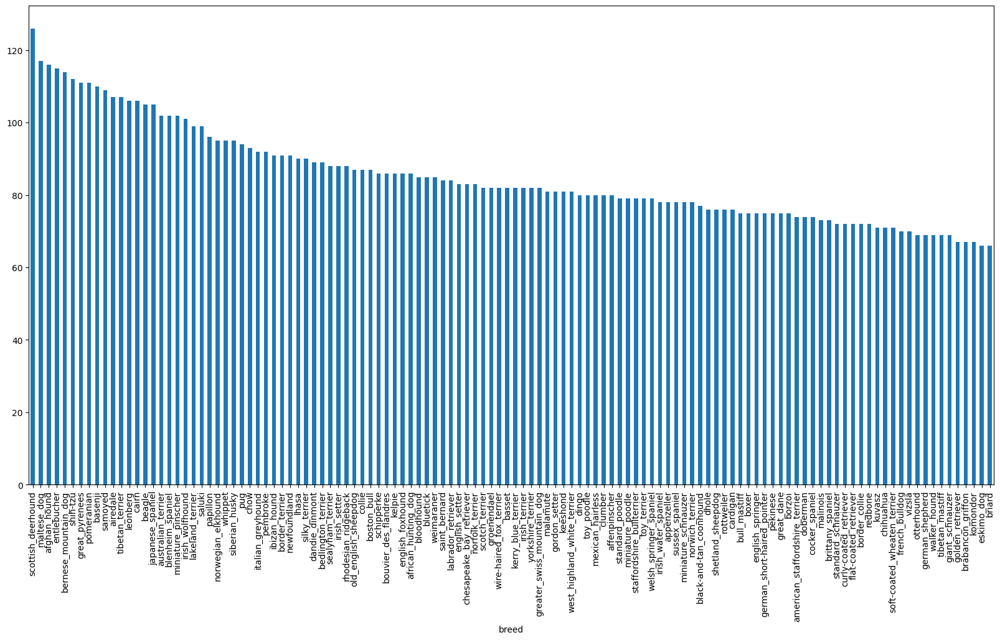

In [ ]:
labels_csv["breed"].value_counts().plot.bar(figsize=(20,10))

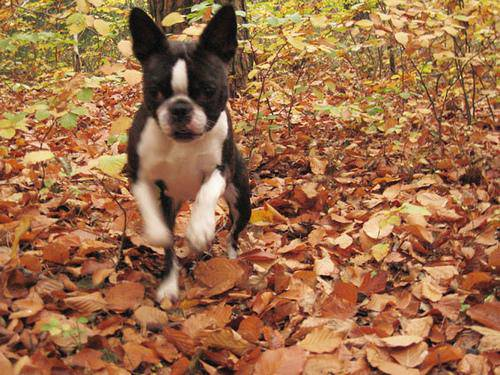

In [ ]:
# view an image
from IPython.display import Image
Image("/content/drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg")

### Getting images and their labels
get a list of all the image file pathnames

In [ ]:
# create pathname from image ID's
filenames = ["drive/MyDrive/Dog Vision/train/" + fname + ".jpg" for fname in labels_csv["id"]]
filenames

['drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg',
 'drive/MyDrive/Dog Vision/train/004396df1acd0f1247b740ca2b14616e.jpg',
 'drive/MyDrive/Dog Vision/train/0067dc3eab0b3c3ef0439477624d85d6.jpg',
 'drive/MyDrive/Dog Vision/train/00693b8bc2470375cc744a6391d397ec.jpg',
 'drive/MyDrive/Dog Vision/train/006cc3ddb9dc1bd827479569fcdc52d

In [ ]:
# check numbers of filenames matches number of files
import os
if len(os.listdir("drive/MyDrive/Dog Vision/train/")) == len(filenames):
  print("ok")
else:
  print("nok")

nok


Preparing the labels



In [ ]:
labels = labels_csv["breed"].to_numpy()
# labels = np.array(labels)
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
len(labels)

10222

In [ ]:
if len(labels) == len(filenames):
  print("ok")
else:
  print("nok")

ok


In [ ]:
unique_breeds = np.unique(labels)
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [ ]:
# turn a single label into an array of booleans
labels[0] == unique_breeds

array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
# turn every label into an array of booleans
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

### Creating our own validation set
Kaggle doesn't come wit a validation set

In [ ]:
# Setup X & y variables
X = filenames
y = boolean_labels

Try with a 1000 images first

In [ ]:
# Set number of images to use for experimenting
NUM_IMAGES = 125 # @param {type:"slider", min:0, max:10000, step:100}

In [ ]:
# Let's split data into train and validation
from sklearn.model_selection import train_test_split
# np.random.seed(42)
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES], y[:NUM_IMAGES], test_size=0.2, random_state=42)
len(X_train), len(X_val), len(y_train), len(y_val)

(100, 25, 100, 25)

In [ ]:
X_train[:2], y_train[:2]

(['drive/MyDrive/Dog Vision/train/01a41985ab8209e750588fa348d635be.jpg',
  'drive/MyDrive/Dog Vision/train/00693b8bc2470375cc744a6391d397ec.jpg'],
 [array([False, False, False, False, False,  True, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, Fal

## Preprocessing images - turning images into tensors
write a function that:
1. takes an image filepath as input
2. use tensorflow to read the file and save it to a a variable
3. turn image into tensors
4. normilize images (from 255 to 1)
5. resize the image to (224, 224)
6. return modified image

In [ ]:
# Convert image to numpy array
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

In [ ]:
# turn image into a tensor
tf.constant(image)

<tf.Tensor: shape=(257, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 56, 104,  66],
        [ 58, 106,  68],
        [ 64, 112,  74],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 74, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  11],
        [  8,  14,  14],
        ...,
        [120, 113,  67],
        [126, 118,  71],
        [122, 114,  67]],

       [[  0,   3,   7],
        [  2,   7,  10],
        [  3,   9,   7],
        ...,
        [105,  98,  54],
        [112, 104,  58],
        [111, 103,  57]],

       [[ 16,  18,  30],
        [ 16,  19,  24],
        [ 15,  20,  14],
        ...,
        [101,  92,  5

In [ ]:
# Define image size
IMG_SIZE = 224

# Function for preprocessing images
def process_image(image_path, img_size=IMG_SIZE):
  # read image file
  image = tf.io.read_file(image_path)
  # turn the jpeg image into numerical Tensor with 3 color channels (rgb)
  image = tf.image.decode_jpeg(image, channels=3)
  # convert color channel values to 0-255 to 0-1
  image = tf.image.convert_image_dtype(image, tf.float32)
  # resize image
  image = tf.image.resize(image, size=[img_size, img_size])
  return image

## Turning data into batches
why turn into batches?
many images at once may not fir into memory
to use tensorflow effectively we need the data in the form of Tensor tuples: `(image, label)`

In [ ]:
# create a function to return a Tensor tuple (image, label)
def get_image_label(image_path, label):
  image = process_image(image_path)
  return image, label

In [ ]:
(process_image(X[42]), tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117759],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

Now we have a way to turn data into Tensor tuples in the form: `(image, label)`, let's make a function to turn all data (`X` & `y`) into batches

In [ ]:
# Define batch size, 32 is a good start
BATCH_SIZE = 32
# create afunction to turn data into batches
def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates batches of data out of image (X) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle it if it's validation data.
  Also accepts test data as input (no labels).
  """
  # if the data is a test dataset, we probably don't have labels
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # only filepaths
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # if the data is a valid dataset, we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), # filepaths
                                               tf.constant(y))) # labels

    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch
  else:
    # if the data is a training dataset, we need to shuffle it
    print("Creating training data batches...")
    # turn filepaths and labels into Tuples
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), # filepaths
                                               tf.constant(y))) # labels
    # Shuffling pathnames and labels before mapping image processor function
    data = data.shuffle(buffer_size=len(X))
    # get images and labels from Tuples
    data = data.map(get_image_label)
    # Turn the training data into batches
    data_batch = data.batch(BATCH_SIZE)
  return data_batch

In [ ]:
# Create training and validation batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [ ]:
# check out attributes of data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing data batches

In [ ]:
import matplotlib.pyplot as plt

# Create a function for viewing images in a data batch
def show_25_images(images, labels):
  """
  Displays 25 images from a data batch.
  """
  # Setup the figure
  plt.figure(figsize=(10, 10))
  # Loop through
  for i in range(25):
    # Create subplots (5 rows, 5 columns)
    ax = plt.subplot(5, 5, i+1)
    # Display an image
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn gird lines off
    plt.axis("off")

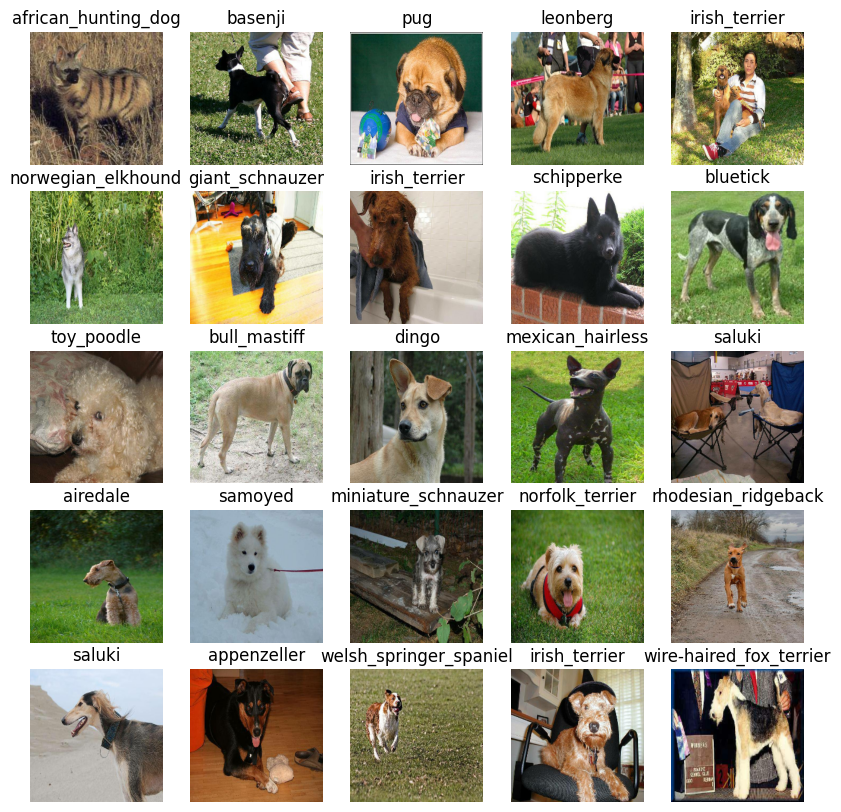

In [ ]:
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images, train_labels)

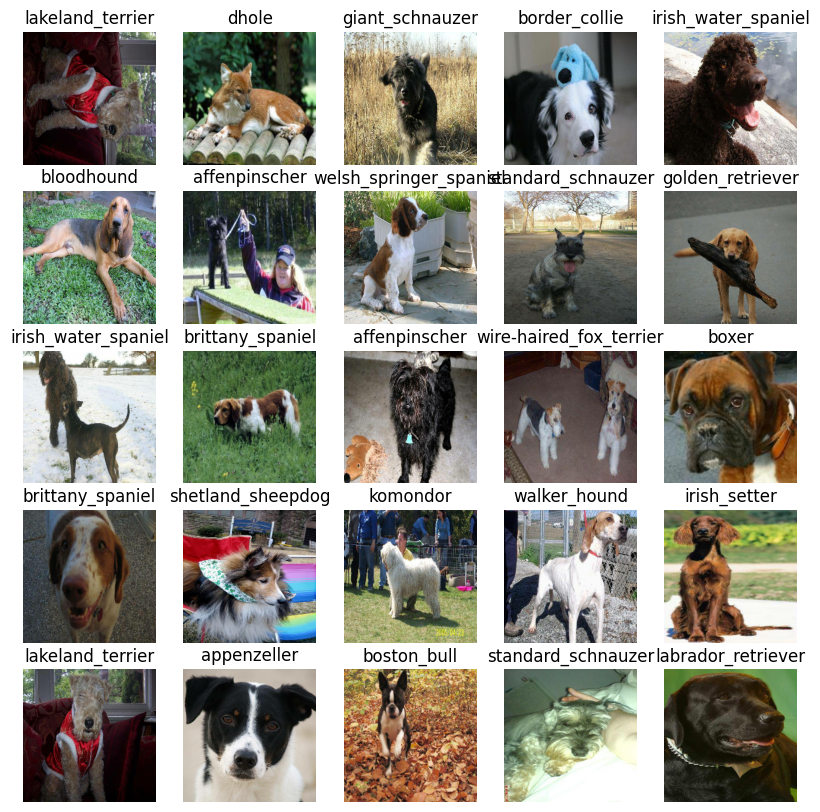

In [ ]:
# Now let's visualize our validation set
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

## Building a model

Before we build a model, define:
* input shape
* output shape
* URL of model we want to use

In [ ]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, colour channels

# Setup output shape of our model
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from TensorFlow Hub
MODEL_URL = "https://www.kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/2"
# MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5"

get input and output together into a keras deep learning model

create a function that:
* takes input shape and output shape and the model
* defines layers in keras model in sequential fashion
* complies the model
* builds the model
* returns the model

In [ ]:
INPUT_SHAPE


[None, 224, 224, 3]

In [ ]:
import tensorflow_hub as hub

In [ ]:
# create function that builds a keras model
def create_model(in_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
    print("building with", model_url)
    # Setup the model layers

    # model = tf.keras.Sequential([
    #     hub.KerasLayer(model_url),
    #     tf.keras.layers.Dense(units=output_shape, activation="softmax")
    # ])
    # hubs_layer = hub.KerasLayer(MODEL_URL)
    # model = tf.keras.Sequential([
    #     tf.keras.layers.Lambda(lambda x: hubs_layer(x)), # Layer 1 (input layer)
    #     tf.keras.layers.Dense(units=OUTPUT_SHAPE, activation="softmax") # Layer 2 (output layer)
    # ])
    model = tf.keras.Sequential([
        # tf.keras.layers.InputLayer(input_shape=input_shape[1:]), # Define input layer explicitly
        # Wrap hub.KerasLayer in a Lambda layer
        tf.keras.layers.Lambda(lambda x: hub.KerasLayer(MODEL_URL)(x)),
        tf.keras.layers.Dense(units=OUTPUT_SHAPE, activation = "softmax") # Layer 2 (output layer)
        # tf.keras.layers.Dense(units=OUTPUT_SHAPE, activation = "sigmoid") # Layer 2 (output layer)
    ])
    # compile the model
    model.compile(
        loss=tf.keras.losses.CategoricalCrossentropy(),
        # loss=tf.keras.losses.BinaryCrossentropy(),
        optimizer=tf.keras.optimizers.Adam(),
        metrics=["accuracy"]
    )
    # build the model
    model.build(in_shape)
    return model

In [ ]:
model = create_model()
model.summary()

building with https://www.kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/2


Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lambda_2 (Lambda)                    │ (None, 1001)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 120)                 │         120,240 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 120,240 (469.69 KB)

 Trainable params: 120,240 (469.69 KB)

 Non-trainable params: 0 (0.00 B)

## creatring callbacks

Callbacks are helper functions a model can use during training to do such things as save its progress, check progress, or stop training early if a model stops improving

### TensorBoard callback

1 load tensorboard notebook extension
2 create a tensorboard that saves logs to a directory and paas it to our model's fit() function
3 visualize our models training logs

In [ ]:
# Load TensorBoard notebook extension
%load_ext tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [ ]:
import datetime

# create a function to build a tenserboard callback
def create_tensorboard_callback():
  # create a log directory for storing TensorBoard logs
  logdir = os.path.join("drive/MyDrive/Dog Vision/logs",
                        # Make it so the logs get racked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

### Early Stopping callback

helps stop model fromoverfitting

https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping

In [ ]:
# Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                   patience=3)

## Training a model (on subset data)

train on smaller set

In [ ]:
NUM_EPOCS = 100 #@param {type: "slider", min:10, max:100, step:10}

Create a function that trains the model

* create a model with create_model()
* setup tensorboard callback using create_tensorboard_callback()
* call fit function on our model passing the training data, validation data, number of epochs and callback functions
* return model

In [ ]:
# build a function to train and return a trained model
def train_model():
  # create a model
  model = create_model()
  # create new TensorBoard session
  tensorboard = create_tensorboard_callback()
  # fit the model to the data passing the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])
  return model


In [ ]:
# Fit model
model = train_model()

building with https://www.kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/2
Epoch 1/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 190s 39s/step - accuracy: 0.0061 - loss: 5.5997 - val_accuracy: 0.0000e+00 - val_loss: 5.1628
Epoch 2/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 30s 2s/step - accuracy: 0.1715 - loss: 3.9506 - val_accuracy: 0.0400 - val_loss: 4.8049
Epoch 3/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 9s 1s/step - accuracy: 0.5005 - loss: 2.6028 - val_accuracy: 0.1200 - val_loss: 4.5466
Epoch 4/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 8s 2s/step - accuracy: 0.7806 - loss: 1.6148 - val_accuracy: 0.1200 - val_loss: 4.3756
Epoch 5/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 8s 1s/step - accuracy: 0.9569 - loss: 0.8653 - val_accuracy: 0.1200 - val_loss: 4.2620
Epoch 6/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 9s 2s/step - accuracy: 0.9630 - loss: 0.5125 - val_accuracy: 0.1600 - val_loss: 4.1978
Epoch 7/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 6s 1s/step - accuracy: 1.0000 - loss: 0.2470 - val_accuracy: 0.1600 - val_loss: 4.1692
Epoch 8/100
4/4 ━━━━━━━

# the model is overfitting
### check tensorboard logs
'%tensorboard' will access the logs

In [ ]:
%tensorboard --logdir drive/MyDrive/Dog\ Vision/logs

Reusing TensorBoard on port 6006 (pid 5727), started 0:06:28 ago. (Use '!kill 5727' to kill it.)

<IPython.core.display.Javascript object>

## Making and evaluating predictions using trained model

In [ ]:
# Make predictions on validation data (not used on training)
predictions = model.predict(val_data, verbose=1)
predictions

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


array([[7.9078227e-04, 3.5696587e-04, 4.8080221e-04, ..., 2.8519644e-04,
        4.8060827e-03, 1.5169487e-03],
       [9.9904696e-03, 1.2908709e-02, 4.5720059e-03, ..., 9.7736800e-03,
        1.2828992e-02, 1.7648360e-02],
       [5.2052061e-03, 1.6834371e-04, 7.4669695e-04, ..., 1.5695452e-03,
        4.6642430e-02, 4.0391702e-04],
       ...,
       [1.5389834e-02, 1.5241264e-04, 3.7164509e-02, ..., 2.4120875e-03,
        7.4319458e-03, 5.4133200e-04],
       [3.0437773e-03, 8.1874983e-05, 1.6695083e-03, ..., 1.4375682e-03,
        2.7669344e-02, 3.7425713e-04],
       [1.9658447e-04, 1.9107008e-04, 1.2708976e-03, ..., 9.3741476e-04,
        3.4125550e-03, 7.8665593e-04]], dtype=float32)

In [ ]:
predictions[0]

array([7.90782273e-04, 3.56965873e-04, 4.80802206e-04, 3.83471847e-02,
       3.40245833e-06, 9.09276860e-05, 2.98530766e-04, 2.54570297e-03,
       8.10014626e-06, 8.85273494e-06, 5.59763134e-01, 2.11360675e-05,
       1.73339469e-03, 1.58229318e-06, 2.81943008e-04, 1.19853718e-03,
       2.59458920e-05, 4.68587801e-02, 4.37622628e-04, 2.32450664e-03,
       5.27056159e-07, 3.25935725e-05, 2.00715181e-06, 4.35490147e-05,
       9.94401053e-05, 6.37934500e-05, 2.87858862e-03, 2.07822650e-05,
       9.05373054e-06, 1.09827728e-03, 6.84609131e-06, 1.99648184e-06,
       4.20162360e-06, 2.22814884e-02, 6.18585764e-05, 1.85001973e-05,
       3.40380393e-05, 3.06080387e-04, 3.04793211e-04, 8.25213306e-07,
       3.83690465e-04, 5.73962052e-06, 1.00771962e-04, 1.92689140e-06,
       8.18188055e-05, 1.92746575e-05, 2.01981282e-03, 2.84281987e-06,
       6.73736632e-03, 3.08372168e-04, 6.15237241e-06, 1.14958220e-05,
       2.57808551e-07, 1.11335712e-05, 3.99326527e-05, 2.74123100e-04,
      

In [ ]:
np.sum(predictions[0])

1.0

In [ ]:
# First prediction
index = 0
print(predictions[index])
print(f"max value (prediction probability): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"max index: {np.argmax(predictions[index])}")
print(f"class name: {unique_breeds[np.argmax(predictions[index])]}")

[7.90782273e-04 3.56965873e-04 4.80802206e-04 3.83471847e-02
 3.40245833e-06 9.09276860e-05 2.98530766e-04 2.54570297e-03
 8.10014626e-06 8.85273494e-06 5.59763134e-01 2.11360675e-05
 1.73339469e-03 1.58229318e-06 2.81943008e-04 1.19853718e-03
 2.59458920e-05 4.68587801e-02 4.37622628e-04 2.32450664e-03
 5.27056159e-07 3.25935725e-05 2.00715181e-06 4.35490147e-05
 9.94401053e-05 6.37934500e-05 2.87858862e-03 2.07822650e-05
 9.05373054e-06 1.09827728e-03 6.84609131e-06 1.99648184e-06
 4.20162360e-06 2.22814884e-02 6.18585764e-05 1.85001973e-05
 3.40380393e-05 3.06080387e-04 3.04793211e-04 8.25213306e-07
 3.83690465e-04 5.73962052e-06 1.00771962e-04 1.92689140e-06
 8.18188055e-05 1.92746575e-05 2.01981282e-03 2.84281987e-06
 6.73736632e-03 3.08372168e-04 6.15237241e-06 1.14958220e-05
 2.57808551e-07 1.11335712e-05 3.99326527e-05 2.74123100e-04
 7.98163470e-04 1.62314400e-01 3.73938674e-04 4.50633024e-06
 1.31402328e-06 1.73414792e-05 1.07332844e-05 5.30799793e-04
 9.42523366e-06 2.462460

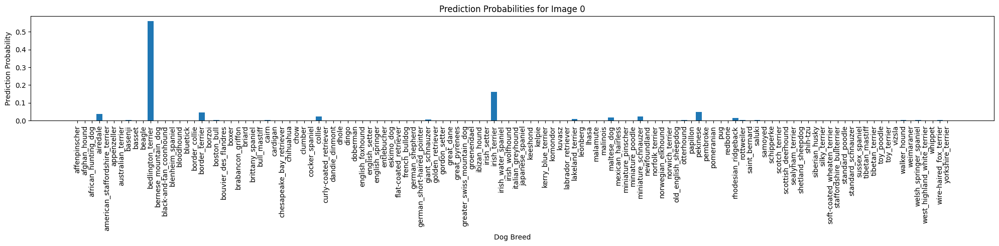

In [ ]:
# prompt: create a bar graph with prediction[0] and make the x axis occupy the whole page

import matplotlib.pyplot as plt
import numpy as np
# Turn prediction probabilities into their respective label (easier to understand)
pred_label = [unique_breeds[np.argmax(prediction_probability)] for prediction_probability in predictions]
pred_label[:10]
# Get the predicted labels of the validation data
y_true = [unique_breeds[np.argmax(true_label)] for true_label in y_val]
y_true[:10]
# Setup x-axis tick marks
x_ticks = np.arange(len(unique_breeds))
# Create a bar chart
plt.figure(figsize=(20, 5))
plt.bar(x_ticks, predictions[0])
plt.xticks(x_ticks, unique_breeds, rotation=90)  # Set x-axis labels to breed names
plt.xlabel("Dog Breed")
plt.ylabel("Prediction Probability")
plt.title("Prediction Probabilities for Image 0")
plt.tight_layout()  # Adjust layout to prevent labels from overlapping
plt.show()


In [ ]:
# turn prediction probabilities into their respective labels
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]


# get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[0])
pred_label

'bedlington_terrier'

In [ ]:
## Create a function to unbatch a batch dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tuples and returns separate arrays
  of images and labels.
  """
  images = []
  labels = []
  # loop through all the batches
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])

  return images, labels


# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.00784314, 0.00392157, 0.        ],
         [0.00392157, 0.00784314, 0.        ],
         [0.00392157, 0.00784314, 0.        ],
         ...,
         [0.39637563, 0.34860766, 0.5459306 ],
         [0.38927397, 0.39288273, 0.43594864],
         [0.5954294 , 0.62155867, 0.598073  ]],
 
        [[0.00784314, 0.00392157, 0.        ],
         [0.00784314, 0.00392157, 0.        ],
         [0.00392157, 0.00784314, 0.        ],
         ...,
         [0.61788416, 0.5807307 , 0.71904504],
         [0.5324265 , 0.5426441 , 0.58257955],
         [0.5685837 , 0.59211314, 0.58913547]],
 
        [[0.01321779, 0.00123424, 0.        ],
         [0.00784314, 0.00392157, 0.        ],
         [0.00392157, 0.00784314, 0.        ],
         ...,
         [0.9097923 , 0.8981558 , 0.95931107],
         [0.5557031 , 0.56761146, 0.59791577],
         [0.5263359 , 0.5498653 , 0.54780173]],
 
        ...,
 
        [[0.06151076, 0.00660879, 0.00660879],
         [0.06151076, 0.00660879, 0.00660

In [ ]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth label and image for sample n.
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]
  # Get the pred label
  pred_label = get_pred_label(pred_prob)
  # Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])
  # Change the color of the title depending on if the prediction is right or wrong
  # print(pred_label,true_label)
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"
  # Change plot title to be the model prediction and the ground truth label
  plt.title("{} {:2.0f}% {}".format(pred_label, np.max(pred_prob)*100, true_label), color=color)
  # plt.show()


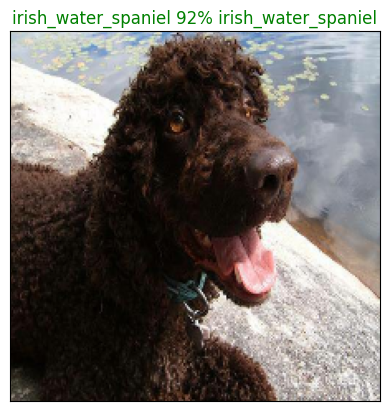

In [ ]:
plot_pred(predictions, val_labels, val_images, 4)

In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plots the top 10 highest prediction confidences along with the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]
  # Get the predicted label
  pred_label = get_pred_label(pred_prob)
  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]
  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")
  # Change color of true label
  # print(true_label, top_10_pred_labels)
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

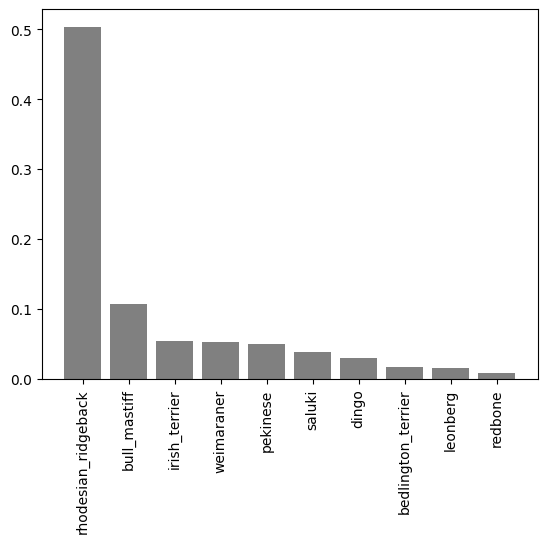

In [ ]:
plot_pred_conf(predictions, val_labels, 9)

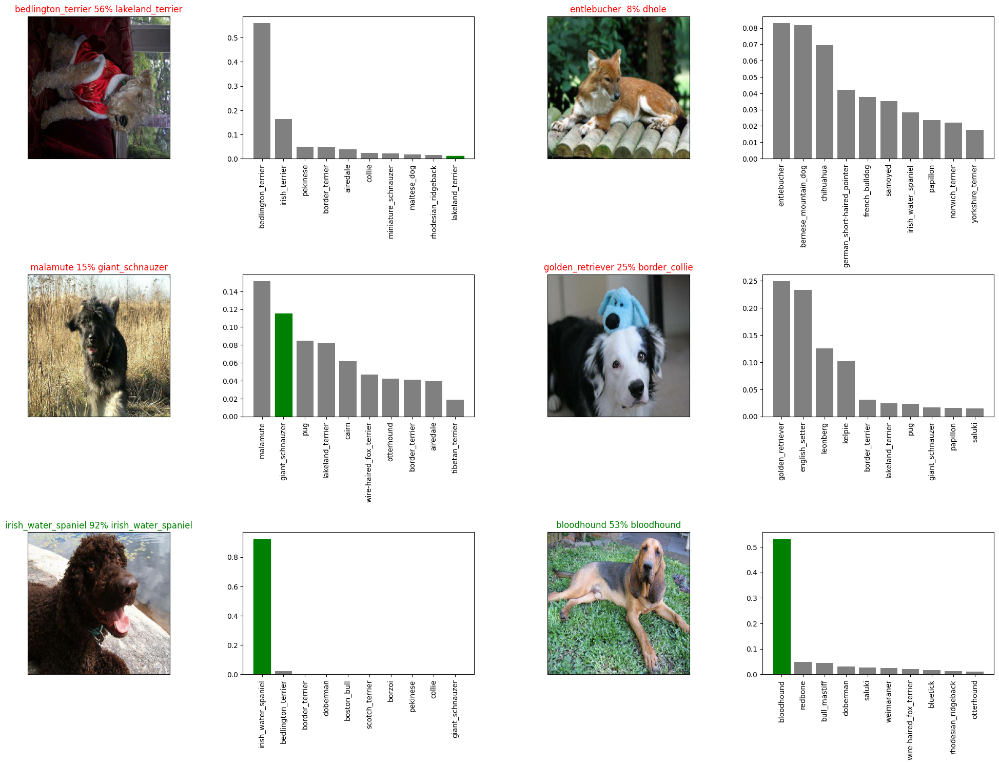

In [ ]:
i_multiplier = 0
num_rows = 3
num_cols = 2
num_images = num_rows * num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(predictions, val_labels, val_images, i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(predictions, val_labels, i+i_multiplier)

plt.tight_layout(h_pad=1.0)
plt.show()

In [ ]:
# Create a function to save a model
def save_model(model, suffix=None):
  """
  Saves a given model in a models directory and appends a suffix (str)
  for clarity.
  """
  # Create a model directory pathname with current time
  modeldir = os.path.join("drive/MyDrive/Dog Vision/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".keras" # save format of model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [ ]:
# Create a function to load a model
def load_model(model_path):
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path)
  # model = tf.keras.models.load_model(model_path,
  #                                    custom_objects={"KerasLayer":hub.KerasLayer})
  return model

In [ ]:
model_path = save_model(model, suffix="100-images-mobilenetv2-130")

Saving model to: drive/MyDrive/Dog Vision/models/20240826-18571724698636-100-images-mobilenetv2-130.keras...


In [ ]:
tf.keras.config.enable_unsafe_deserialization()

In [ ]:
loaded_modelx = load_model(model_path)

Loading saved model from: drive/MyDrive/Dog Vision/models/20240826-18571724698636-100-images-mobilenetv2-130.keras


ValueError: Sequential model 'sequential_3' has already been configured to use input shape (None, 224, 224, 3). You cannot build it with input_shape [None, 224, 224, 3]

## Training on a full dataset

In [ ]:
# Create a data batch with the full data set
full_data = create_data_batches(X, y)

Creating training data batches...


In [ ]:
# Create a model for full model
full_model = create_model()

building with https://www.kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/2


In [ ]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
# No validaion set when trainning on all data, so we can't monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience=3)

**NOTE:** the cell below will take a while

In [ ]:
# Fit the full model to the full data
full_model.fit(x=full_data,
               epochs=3,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/3
320/320 ━━━━━━━━━━━━━━━━━━━━ 572s 2s/step - accuracy: 0.4822 - loss: 2.3760
Epoch 2/3
320/320 ━━━━━━━━━━━━━━━━━━━━ 562s 2s/step - accuracy: 0.8872 - loss: 0.3953
Epoch 3/3
320/320 ━━━━━━━━━━━━━━━━━━━━ 566s 2s/step - accuracy: 0.9411 - loss: 0.2236


In [ ]:
full_model_path = save_model(full_model, suffix="all-images-mobilenetv2-130")

Saving model to: drive/MyDrive/Dog Vision/models/20240826-20581724705930-all-images-mobilenetv2-130.keras...


In [ ]:
loaded_full_model = load_model(full_model_path)

Loading saved model from: drive/MyDrive/Dog Vision/models/20240826-19341724700877-all-images-mobilenetv2-130.keras


ValueError: Sequential model 'sequential_3' has already been configured to use input shape (None, 224, 224, 3). You cannot build it with input_shape [None, 224, 224, 3]

## Making predictions on test dataset
To make predictions on teat data:
* get the test image filenames ✅
* convert filenames into test data batches using "create_data_batches" and seeting "test_data=True" ✅
* make a predictions array by passing the test barches to "predict()" method called on your model

In [ ]:
# Load test image filenames
test_path = "drive/MyDrive/Dog Vision/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/MyDrive/Dog Vision/test/e18fbb12037c297b90642e99073cd6b4.jpg',
 'drive/MyDrive/Dog Vision/test/f4dd86f78fa8b90ed885ec34af6eb1a8.jpg',
 'drive/MyDrive/Dog Vision/test/ef4501591ee2433e06ff5312df879593.jpg',
 'drive/MyDrive/Dog Vision/test/eb2f2ad0f785a7c85f8c62969be71e2a.jpg',
 'drive/MyDrive/Dog Vision/test/efaa7438a6c3bdf92f90539a1fff55fe.jpg',
 'drive/MyDrive/Dog Vision/test/ed3f78bd3eb6751819212fa111857e51.jpg',
 'drive/MyDrive/Dog Vision/test/ea6005562757cf5a7a37d70134d28870.jpg',
 'drive/MyDrive/Dog Vision/test/f15527e7a063275291e469b4e5db751c.jpg',
 'drive/MyDrive/Dog Vision/test/f0154b8ea1efd5dfb70e43fada42e56d.jpg',
 'drive/MyDrive/Dog Vision/test/ee6dad89684bbbab844ecedf70f4be2d.jpg']

In [ ]:
# create test data batches
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches...


In [ ]:
# make predictions on test data batch using the loaded full model
test_predictions = full_model.predict(test_data, verbose=1)

329/329 ━━━━━━━━━━━━━━━━━━━━ 839s 3s/step


In [ ]:
# save predictions (numpy array) to csv file (for access later)
np.savetxt("drive/MyDrive/Dog Vision/test_predictions.csv", test_predictions, delimiter=",")

In [ ]:
# load predictions (numpy array) from csv file
test_prediction = np.loadtxt("drive/MyDrive/Dog Vision/test_predictions.csv", delimiter=",")

## Preparing test dataset predictions for Kaggle

In [ ]:
# create a pandas dataframe with empty columns
preds_df = pd.DataFrame(columns=["id"] + list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [ ]:
# append test image ids to preds_df
test_ids = [os.path.splitext(fname)[0] for fname in os.listdir(test_path)]
preds_df["id"] = test_ids
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e18fbb12037c297b90642e99073cd6b4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,f4dd86f78fa8b90ed885ec34af6eb1a8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,ef4501591ee2433e06ff5312df879593,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,eb2f2ad0f785a7c85f8c62969be71e2a,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,efaa7438a6c3bdf92f90539a1fff55fe,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# add the prediction probabilities to each dog breed column
preds_df[unique_breeds] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e18fbb12037c297b90642e99073cd6b4,7.634870e-06,6.696449e-06,1.400672e-05,9.999400e-06,2.416126e-04,1.254991e-06,8.939771e-01,7.050943e-05,3.051262e-06,...,6.229887e-05,8.315682e-05,2.072251e-06,5.250685e-07,1.289852e-06,2.346642e-05,9.796633e-05,3.991972e-06,9.609330e-05,4.519378e-02
1,f4dd86f78fa8b90ed885ec34af6eb1a8,2.323200e-08,2.367021e-08,1.635596e-06,3.133371e-08,1.560553e-08,3.265471e-07,4.600158e-09,7.436663e-07,1.253476e-08,...,8.484164e-08,2.815602e-06,1.140889e-08,3.236592e-07,4.520437e-06,5.405192e-07,4.772390e-07,9.101820e-07,1.139491e-06,8.509685e-09
2,ef4501591ee2433e06ff5312df879593,3.935450e-06,2.542050e-07,1.451083e-06,6.124826e-05,3.655130e-06,8.658697e-02,1.950182e-06,1.116323e-04,6.390023e-06,...,3.234534e-06,5.298250e-07,2.715273e-06,4.595024e-04,5.006550e-06,7.145639e-05,1.138584e-07,2.029246e-04,5.499440e-05,1.022610e-06
3,eb2f2ad0f785a7c85f8c62969be71e2a,5.166352e-01,7.884041e-04,2.233007e-05,9.634813e-06,1.551988e-05,2.280471e-06,2.641745e-04,1.515767e-05,3.050857e-06,...,2.143568e-03,1.959205e-04,5.211768e-06,2.425334e-06,1.273596e-06,1.987340e-05,4.894563e-05,1.216357e-05,2.492579e-04,1.762964e-03
4,efaa7438a6c3bdf92f90539a1fff55fe,1.206992e-04,4.270572e-05,3.453941e-07,5.145218e-07,2.046460e-06,6.449317e-07,8.176005e-05,4.051563e-07,5.877087e-06,...,1.308124e-06,1.146296e-08,3.317608e-07,2.066806e-07,6.280100e-07,2.621521e-08,1.999236e-07,4.101029e-08,2.075100e-08,3.932753e-07


In [ ]:
preds_df.to_csv("drive/MyDrive/Dog Vision/test_predictions.csv", index=False)

# Making predictions on custom images

In [ ]:
# Get custom images filepaths
custom_path = "drive/MyDrive/Dog Vision/custom_images/"
custom_images_paths = [custom_path + fname for fname in os.listdir(custom_path)]
custom_images_paths

['drive/MyDrive/Dog Vision/custom_images/dog-8262506_640.jpg']

In [ ]:
# turn custom images into batches
custom_data = create_data_batches(custom_images_paths, test_data=True)
custom_data

Creating test data batches...


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
# make predictions on custom data
custom_predictions = full_model.predict(custom_data, verbose=1)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 460ms/step


In [ ]:
# get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_prediction) for custom_prediction in custom_predictions]
custom_pred_labels

['collie']

In [ ]:
# GET CUSTOM IMAGES
custom_images = []
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image[0])

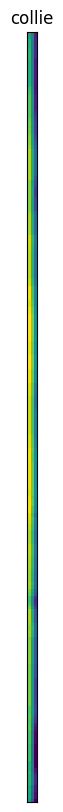

In [ ]:
# check custom image prediction
plt.figure(figsize=(10, 10))
for i, image in enumerate(custom_images):
  plt.subplot(1, 3, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)